In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [66]:
df = pd.read_csv("CC GENERAL.csv")

In [68]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [70]:
df.shape

(8950, 18)

## DATA CLEANING

In [73]:
df.duplicated().sum()

0

In [75]:
df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [79]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [81]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

In [83]:
# Handle missing value
df.fillna(df['MINIMUM_PAYMENTS'].median(),inplace=True)

In [85]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

## Feature  Engineering

In [88]:
# Creating a derived features based on spending and payment behaviour
df['Avg_Monthly_balance'] = df['BALANCE']/(df['TENURE']+1)
df['Payment_Consistency'] = df['PAYMENTS']/(df['MINIMUM_PAYMENTS']+1)
df['Payment_to_Credit_Ratio'] = df['PAYMENTS']/(df['CREDIT_LIMIT']+1)
df['OneOff_vs_Installments'] = df['ONEOFF_PURCHASES']/(df['INSTALLMENTS_PURCHASES']+1)

In [90]:
df.shape

(8950, 22)

In [92]:
df['CREDIT_LIMIT'].describe()

count     8950.000000
mean      4493.982176
std       3638.880937
min         50.000000
25%       1600.000000
50%       3000.000000
75%       6500.000000
max      30000.000000
Name: CREDIT_LIMIT, dtype: float64

In [94]:
## Defining the target variable : Risk Category
df['Risk_Category'] = pd.cut(df['CREDIT_LIMIT'],bins=[-np.inf,1600,6500,np.inf],labels=['High','Medium','Low'])

In [96]:
df.drop(columns=['CUST_ID'],axis=1,inplace=True)

In [98]:
df['Risk_Category'] = df['Risk_Category'].astype(str)

# Analysis:EDA

<Figure size 30000x30000 with 0 Axes>

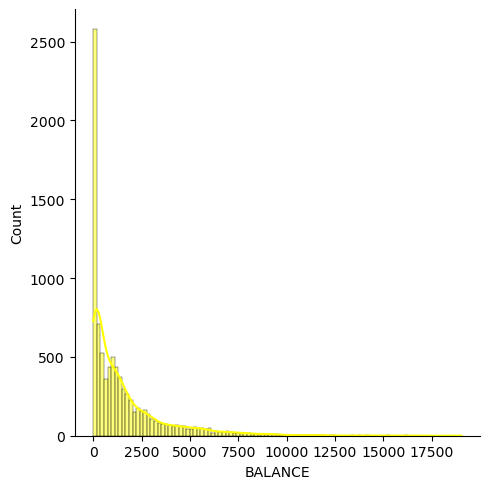

skewness of BALANCE: 2.393386042571806


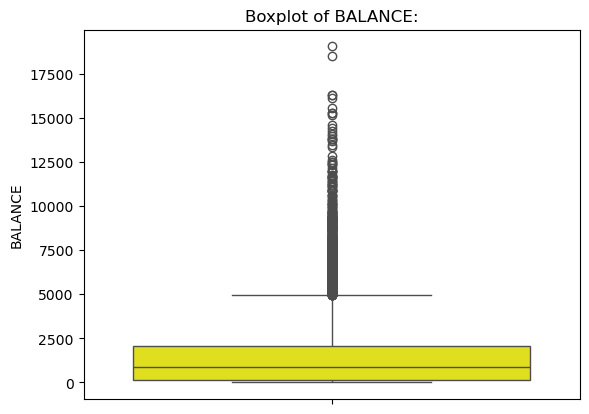

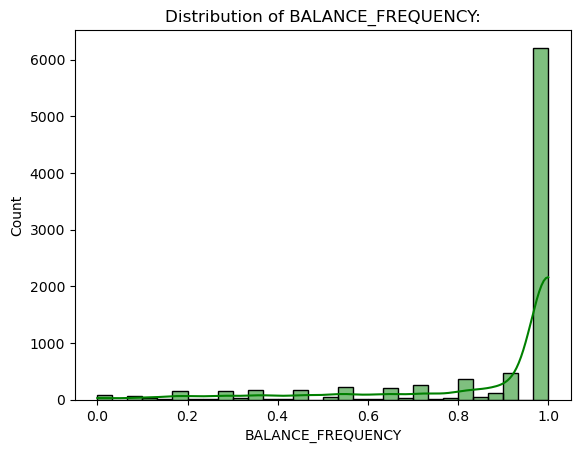

skewness of BALANCE_FREQUENCY: -2.0232655185149078


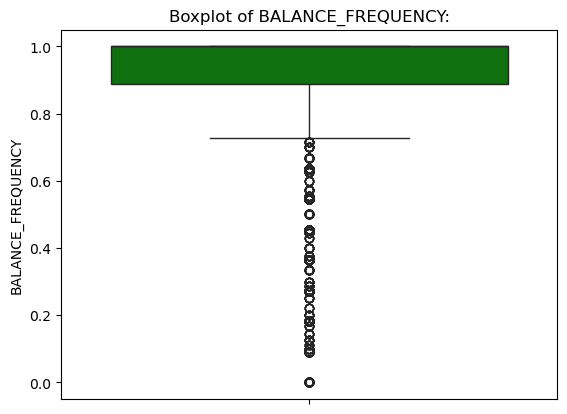

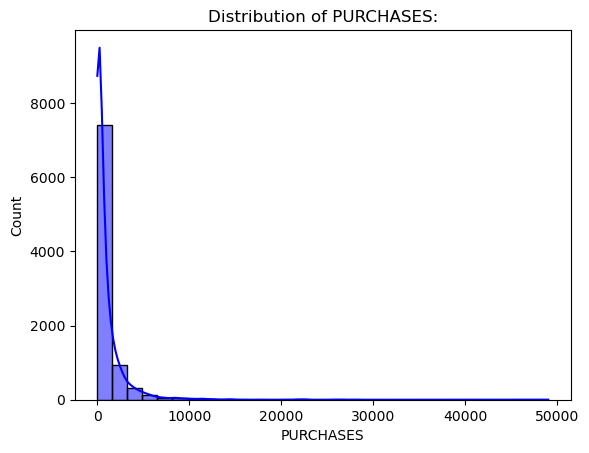

skewness of PURCHASES: 8.144269064554651


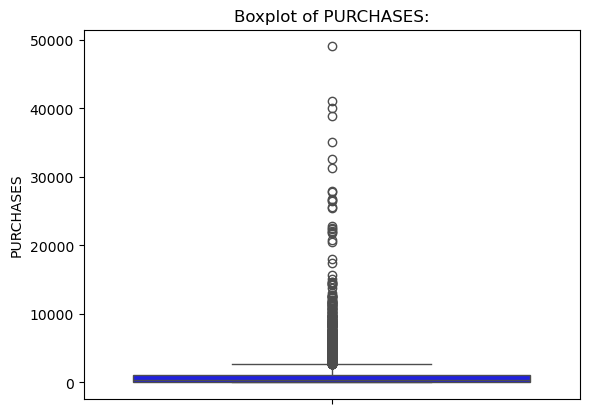

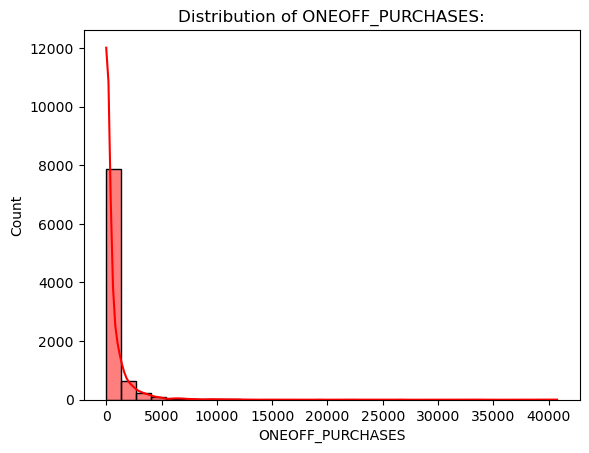

skewness of ONEOFF_PURCHASES: 10.045082884700278


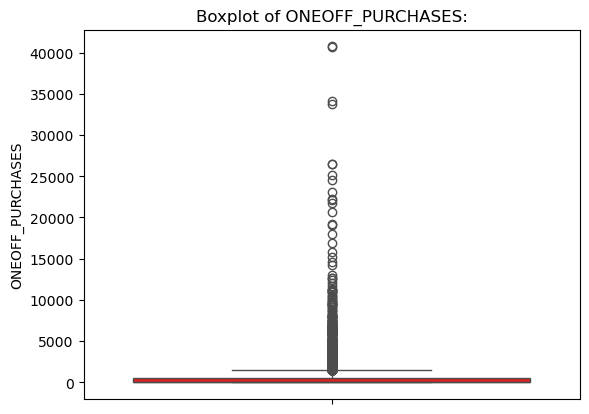

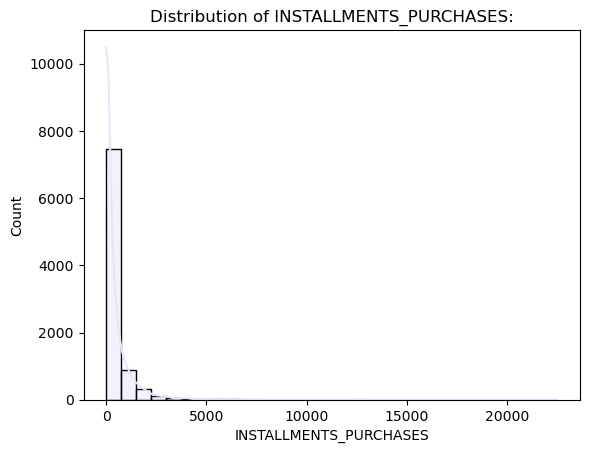

skewness of INSTALLMENTS_PURCHASES: 7.299119908745641


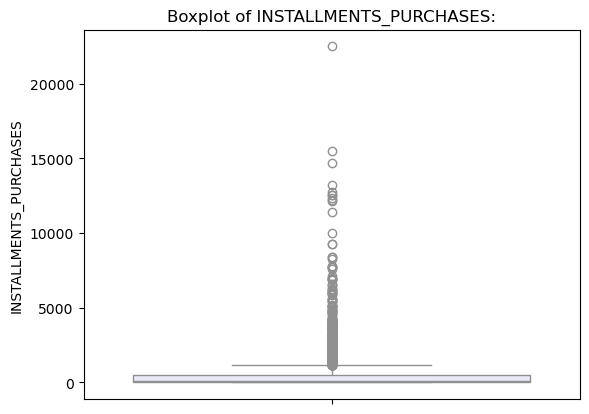

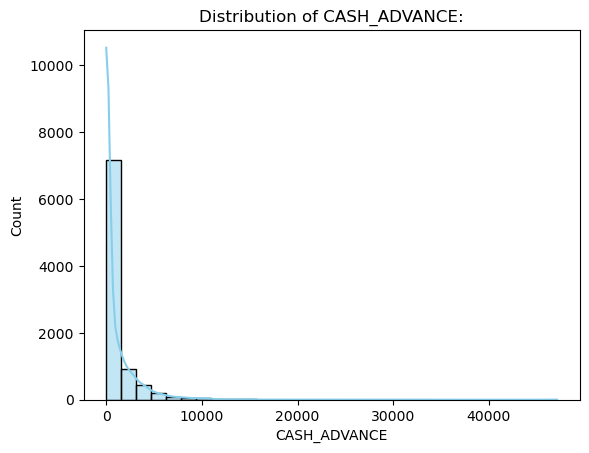

skewness of CASH_ADVANCE: 5.166609074074723


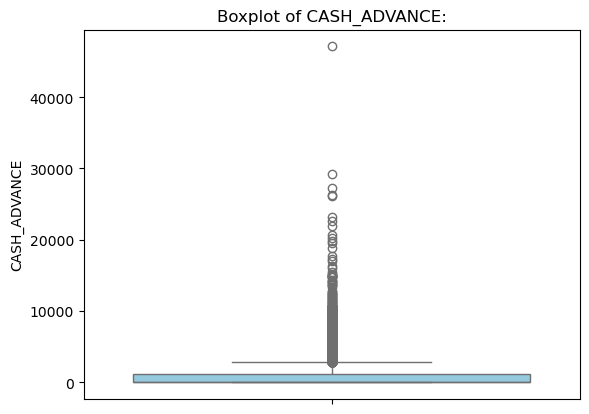

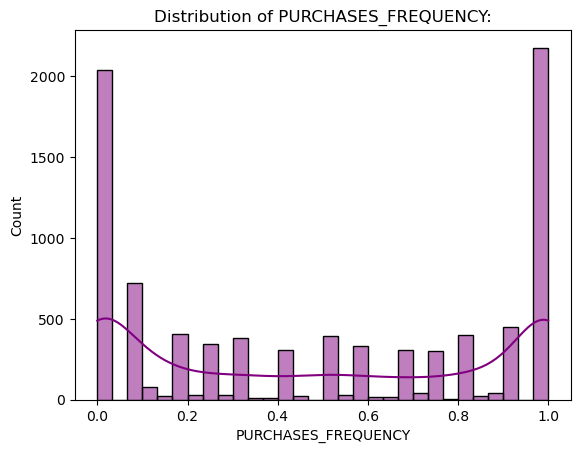

skewness of PURCHASES_FREQUENCY: 0.06016423585803591


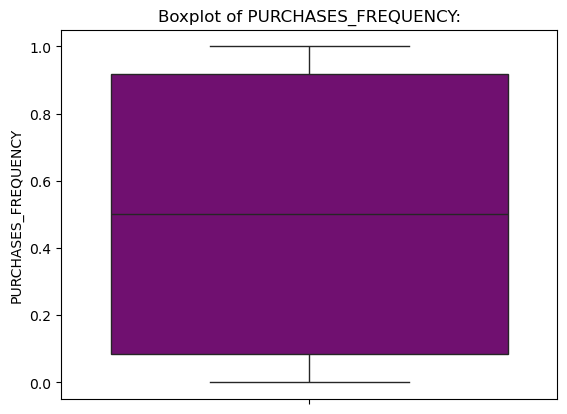

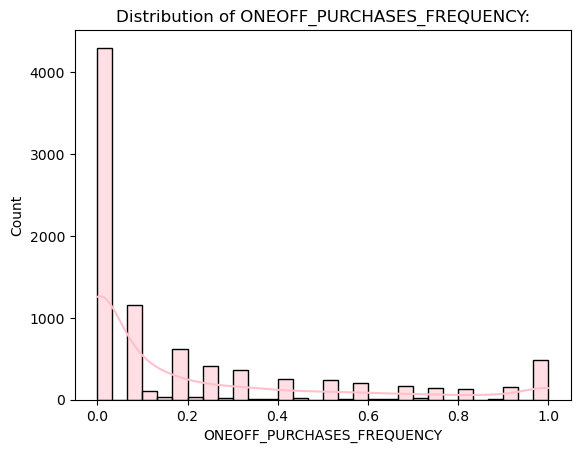

skewness of ONEOFF_PURCHASES_FREQUENCY: 1.5356127835248519


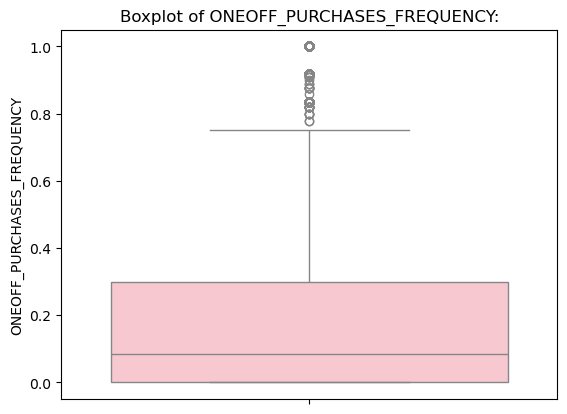

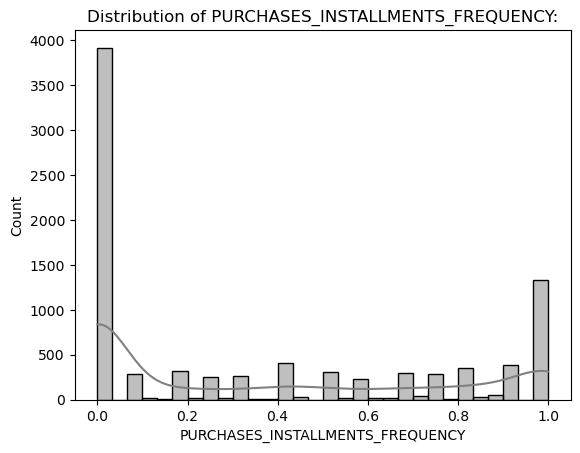

skewness of PURCHASES_INSTALLMENTS_FREQUENCY: 0.5092011649999882


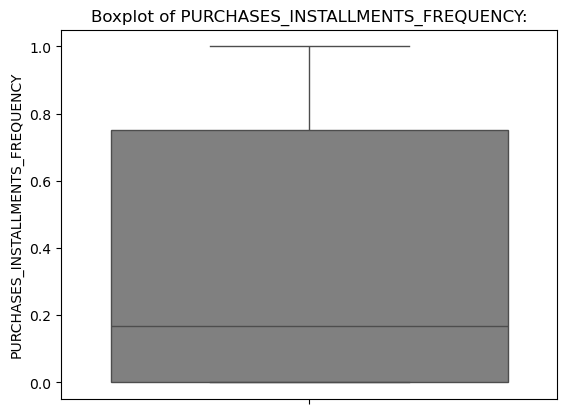

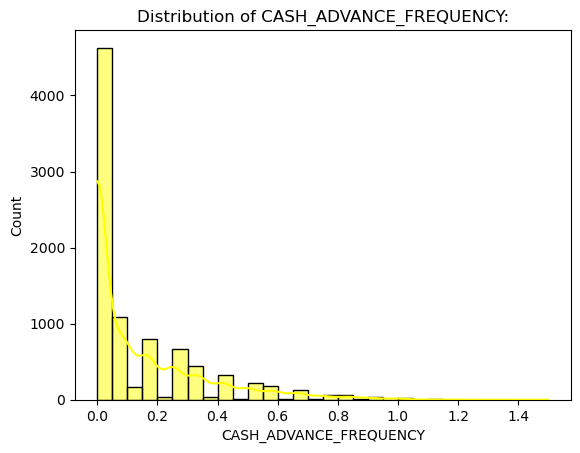

skewness of CASH_ADVANCE_FREQUENCY: 1.828686266477852


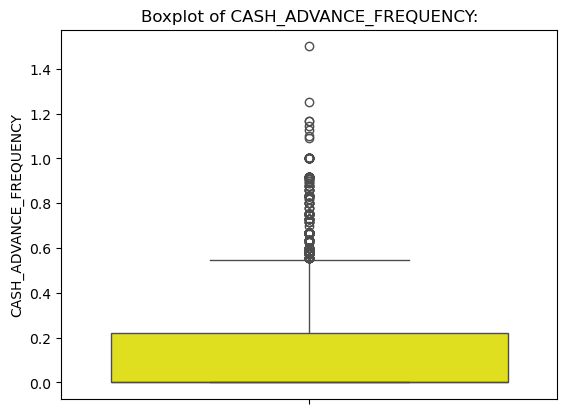

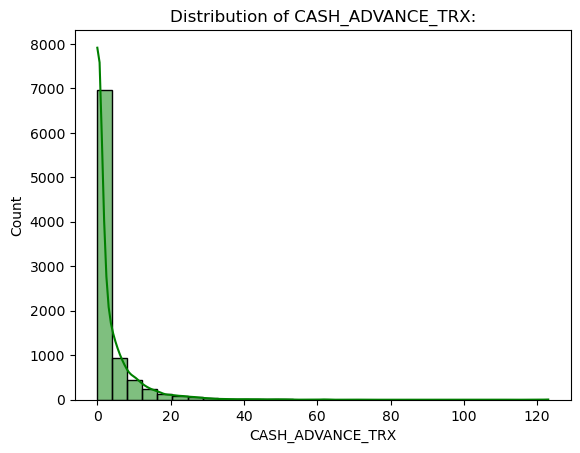

skewness of CASH_ADVANCE_TRX: 5.721298203192298


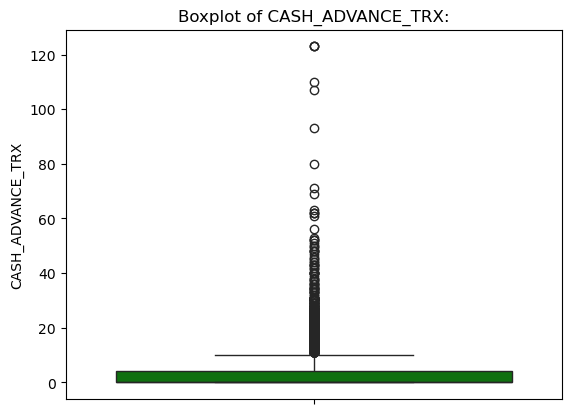

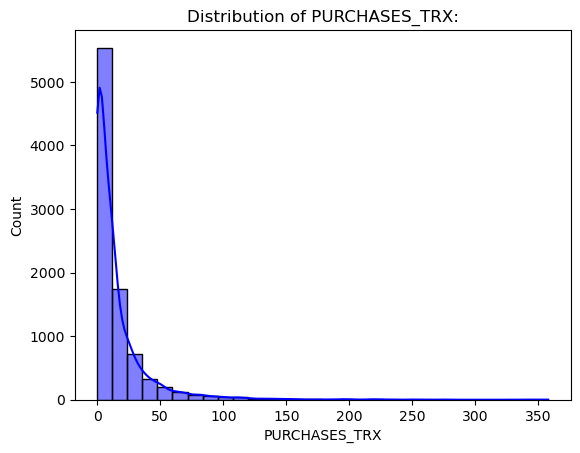

skewness of PURCHASES_TRX: 4.630655265932403


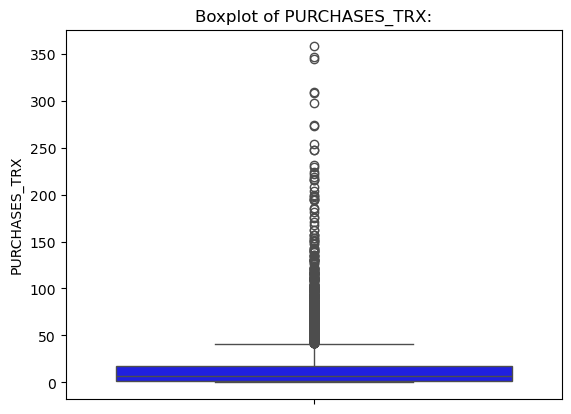

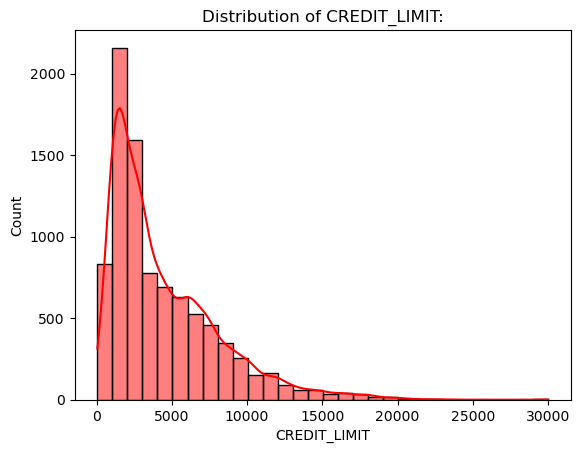

skewness of CREDIT_LIMIT: 1.522427651802718


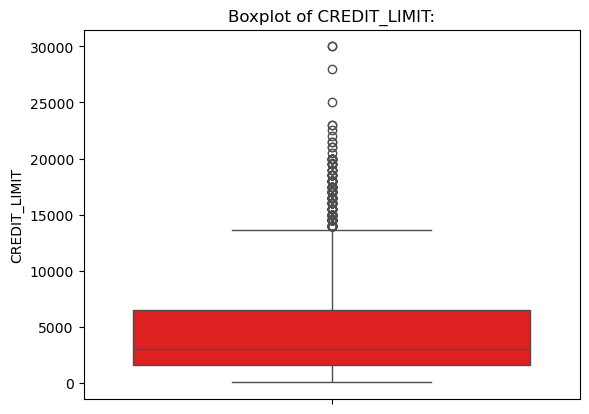

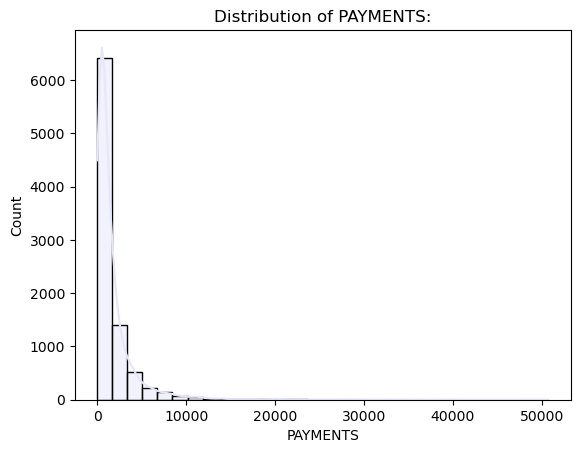

skewness of PAYMENTS: 5.907619794397562


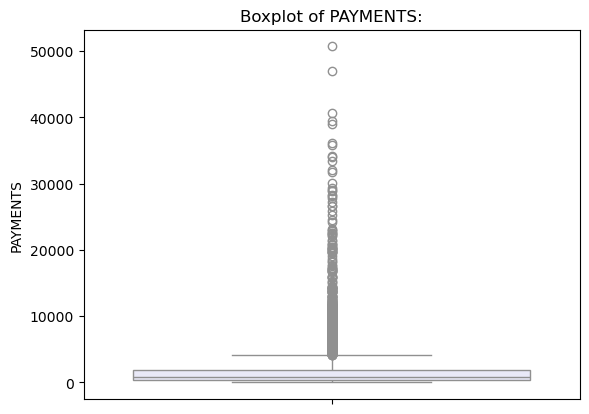

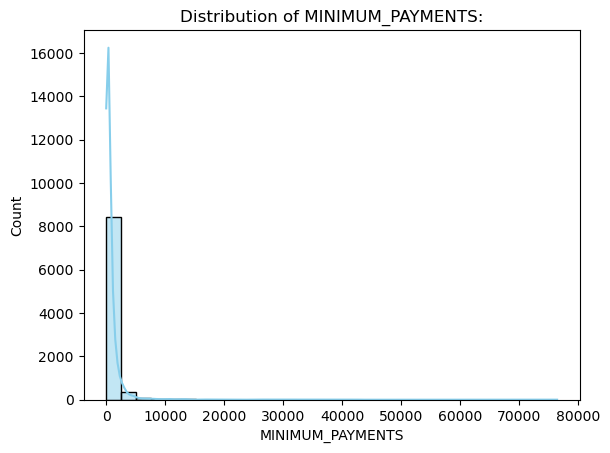

skewness of MINIMUM_PAYMENTS: 13.852446498665346


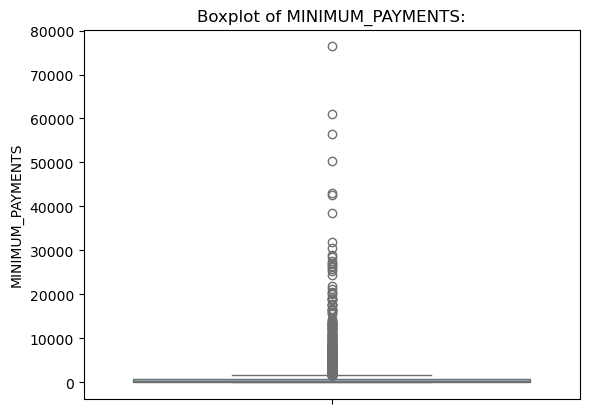

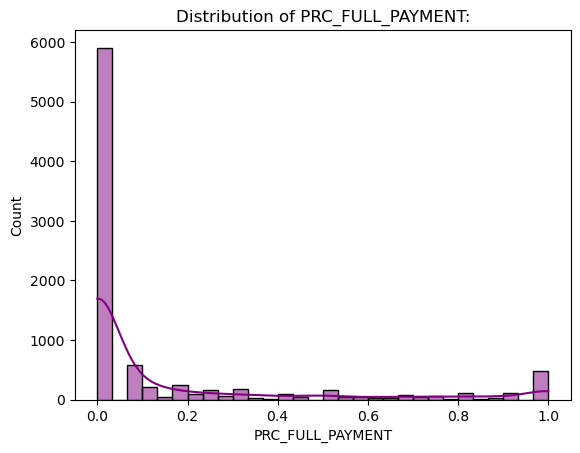

skewness of PRC_FULL_PAYMENT: 1.942819940971858


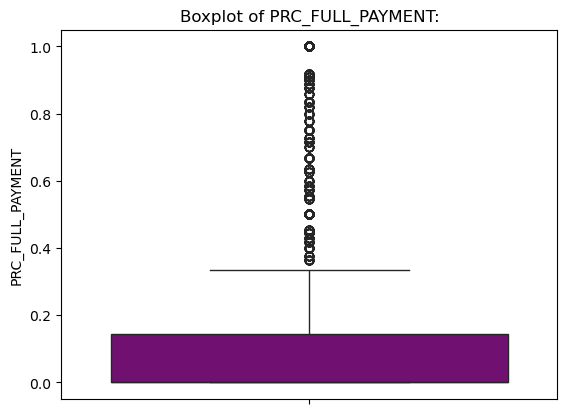

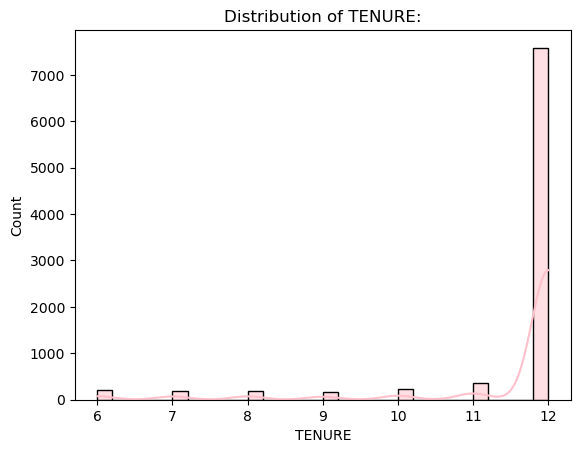

skewness of TENURE: -2.9430172876199134


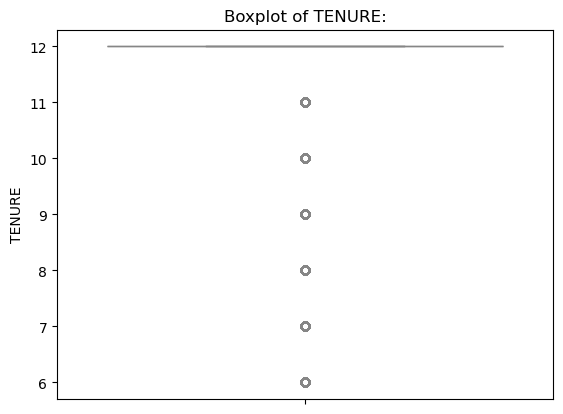

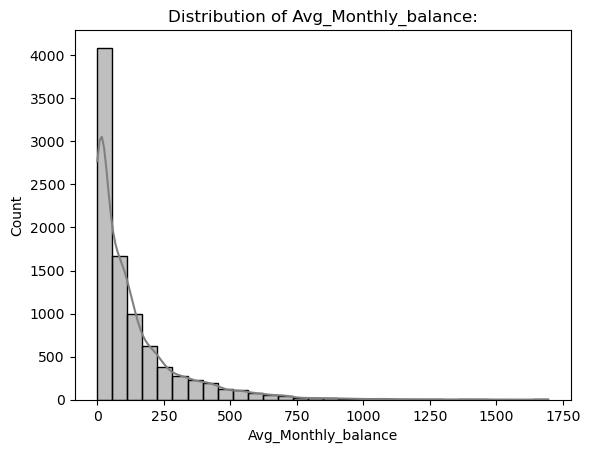

skewness of Avg_Monthly_balance: 2.42974817354643


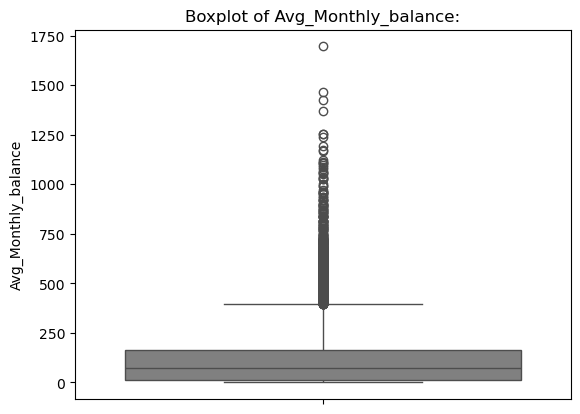

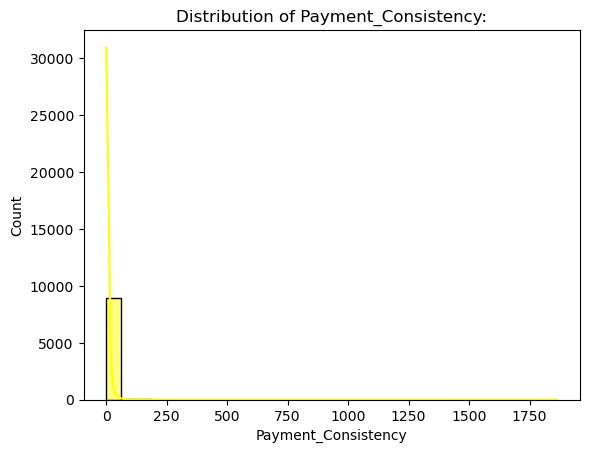

skewness of Payment_Consistency: 36.90224938956822


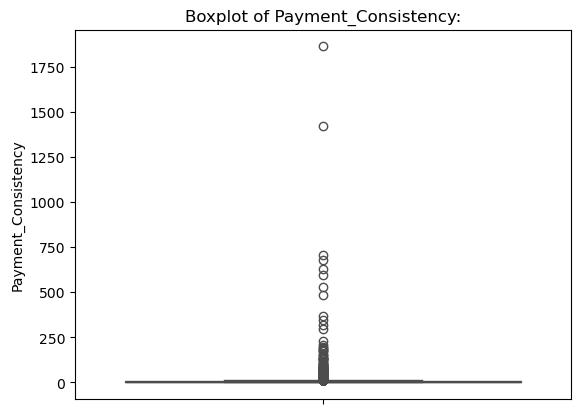

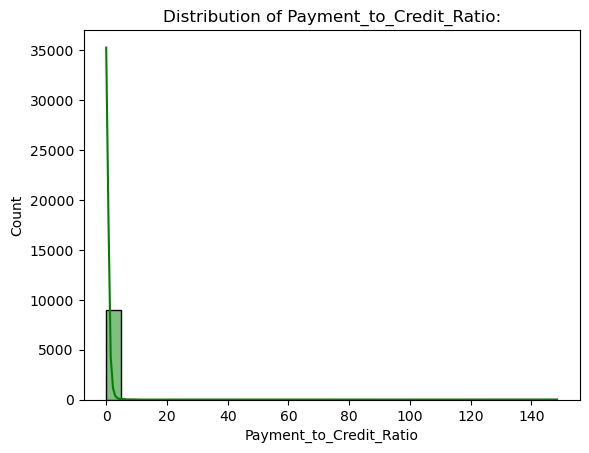

skewness of Payment_to_Credit_Ratio: 77.12682616641503


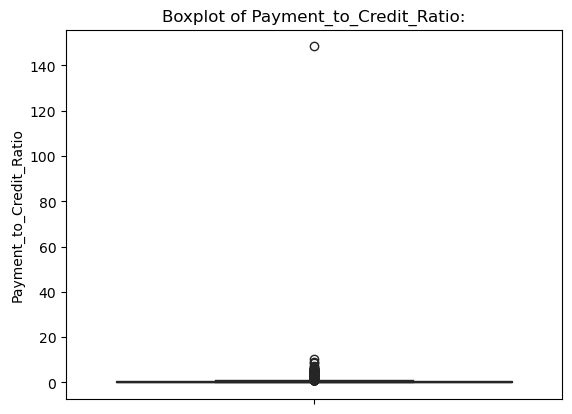

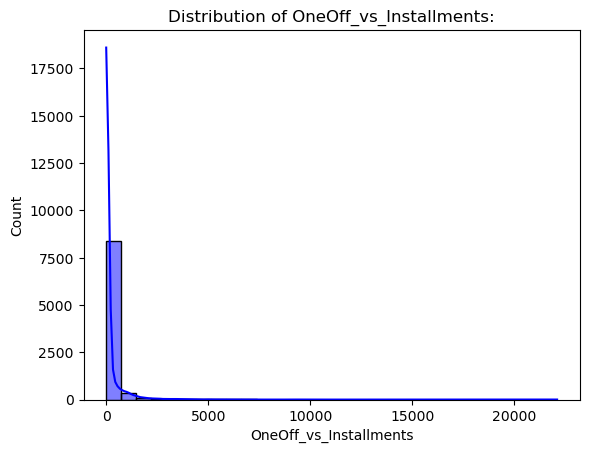

skewness of OneOff_vs_Installments: 13.309522892724234


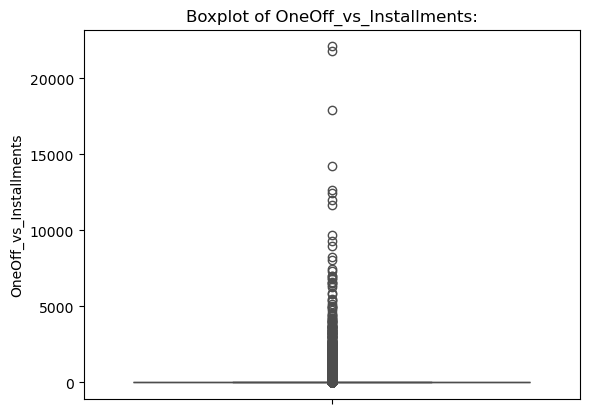

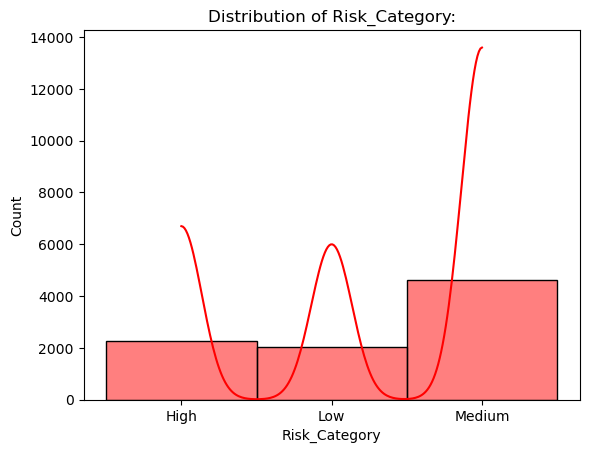

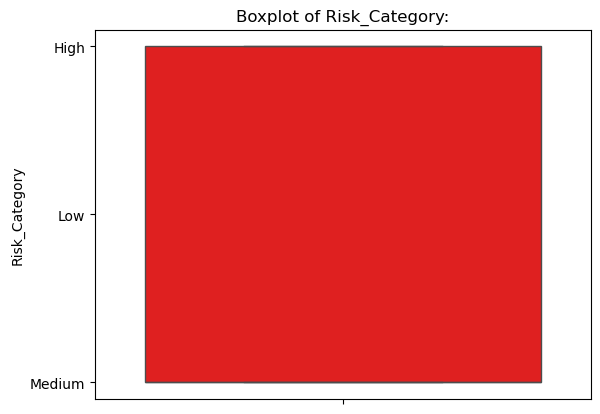

In [98]:
# Univariate Analysis
# Distributon of all the columns and boxplot for outlier
plt.figure(figsize=(300,300))
color=['Yellow','green','blue','red','lavender','skyblue','purple','pink','grey','Yellow','green','blue','red','lavender','skyblue','purple','pink','grey','Yellow','green','blue','red']
for i,col in enumerate(df.columns):
    if col == 'BALANCE':
        sns.displot(df[col],kde=True,color=color[i])
        plt.show()
    else:
        sns.histplot(df[col],kde=True,bins=30,color=color[i])
        plt.title(f'Distribution of {col}:')
        plt.show()
    if df[col].dtype != object:
        print(f'skewness of {col}:',df[col].skew())
    sns.boxplot(df[col],color=color[i])
    plt.title(f'Boxplot of {col}:')
    plt.show()

### LOG Transformation

<Figure size 30000x30000 with 0 Axes>

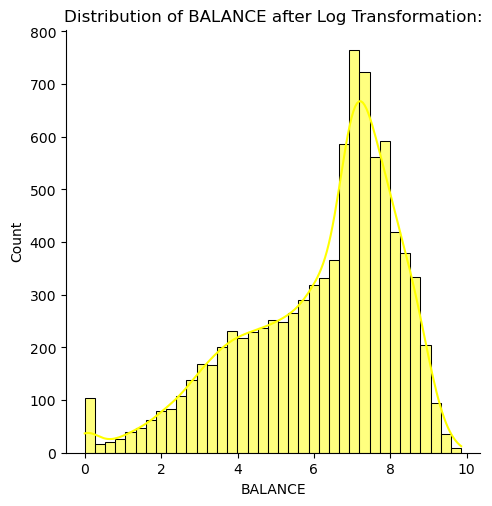

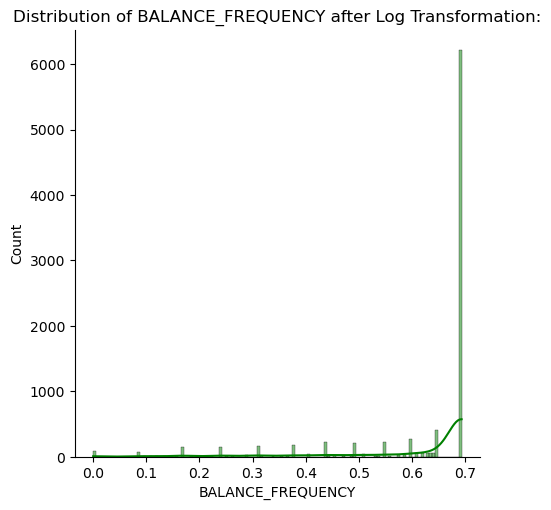

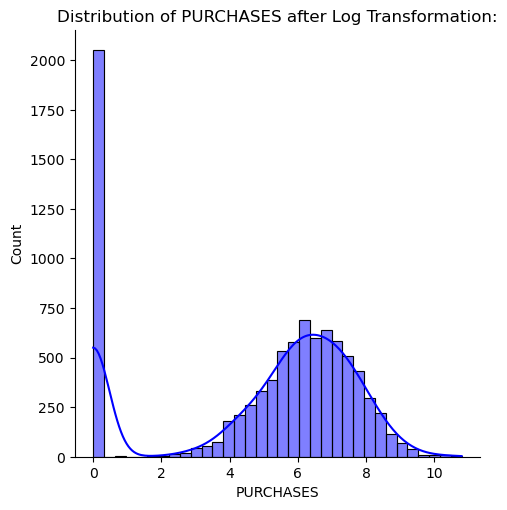

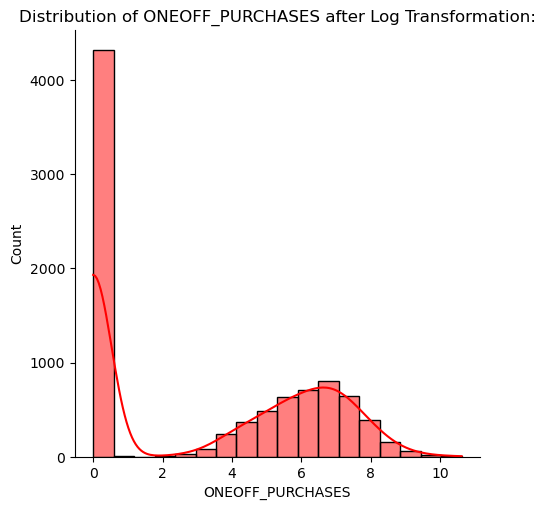

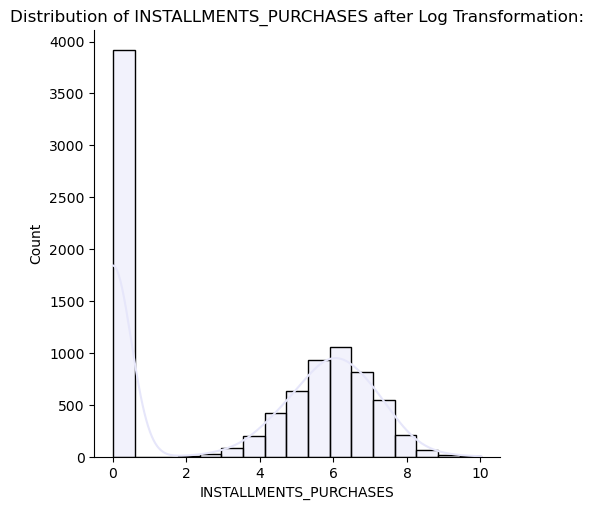

...

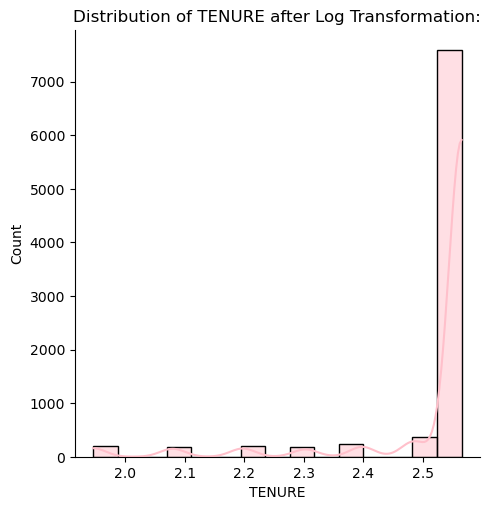

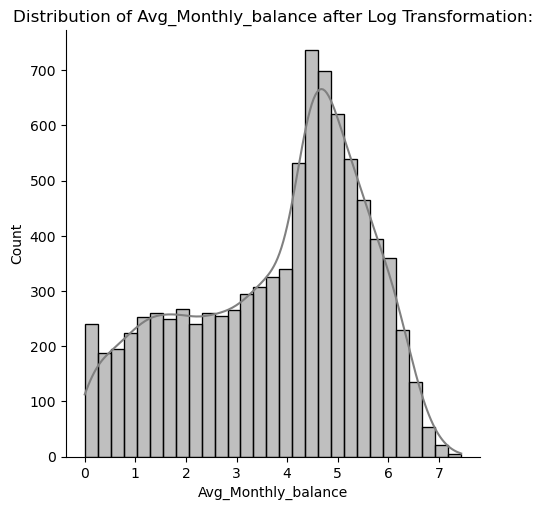

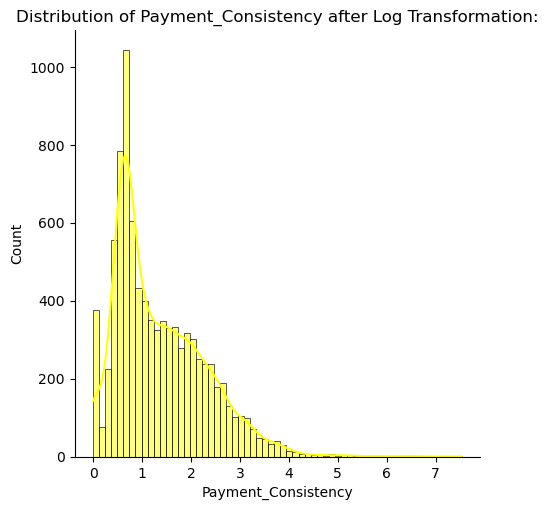

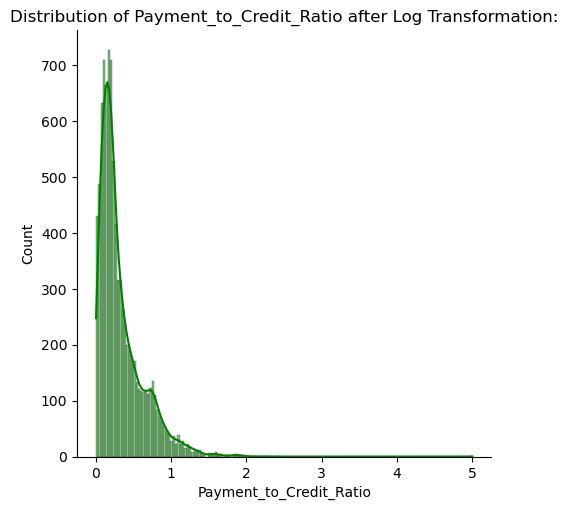

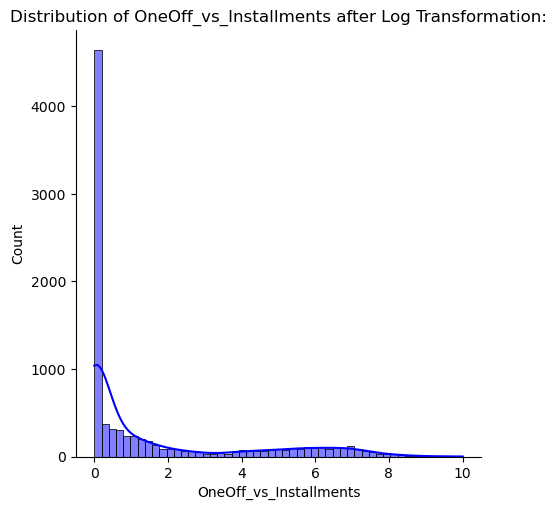

In [101]:
# Distribution of features after log transfomation
plt.figure(figsize=(300,300))
color=['Yellow','green','blue','red','lavender','skyblue','purple','pink','grey','Yellow','green','blue','red','lavender','skyblue','purple','pink','grey','Yellow','green','blue','red']
for i,col in enumerate(df.columns):
    if df[col].dtype != object:
        df[col] = np.log1p(df[col])
        sns.displot(df[col],kde=True,color=color[i])
        plt.title(f'Distribution of {col} after Log Transformation:')
        plt.show()


In [102]:
for i,col in enumerate(df.columns):
    if df[col].dtype != object:
        df[col] = df[col].astype("int")
        print(df[col].dtype)

int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32
int32


## Outlier Detection

In [105]:
# Z score for Outlier detection
from scipy.stats import zscore

# Create a copy of the DataFrame
df1 = df.copy()

# Iterate through columns to calculate Z-scores and remove outliers
for col in df.columns:
    if df[col].dtype != 'object':  # Check if the column is numeric
        # Calculate Z-score
        df1[col + "_zscore"] = zscore(df[col])  # Add Z-score for reference
        # Keep only rows where the Z-score is within -3 and 3
        df1 = df1[df1[col + "_zscore"].abs() > 3]


In [107]:
df1 # we don't have any outlier

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,PURCHASES_TRX_zscore,CREDIT_LIMIT_zscore,PAYMENTS_zscore,MINIMUM_PAYMENTS_zscore,PRC_FULL_PAYMENT_zscore,TENURE_zscore,Avg_Monthly_balance_zscore,Payment_Consistency_zscore,Payment_to_Credit_Ratio_zscore,OneOff_vs_Installments_zscore


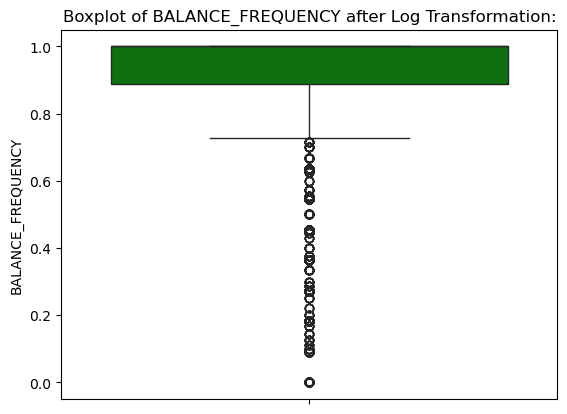

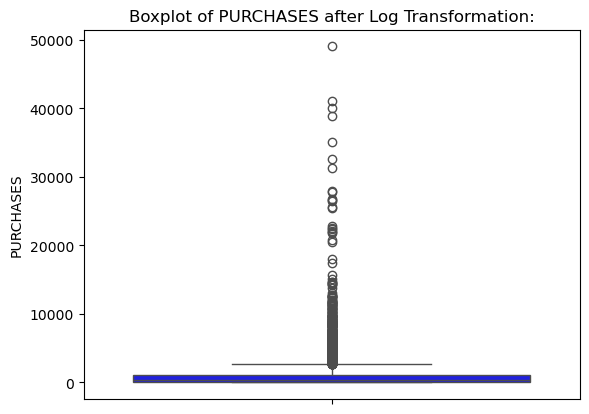

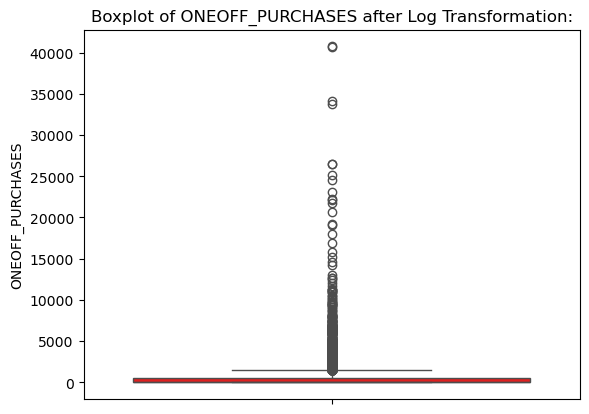

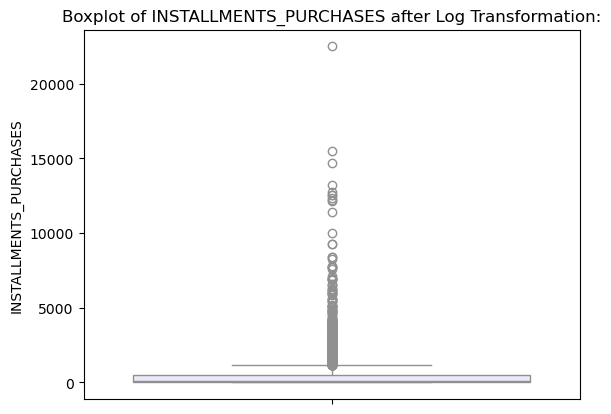

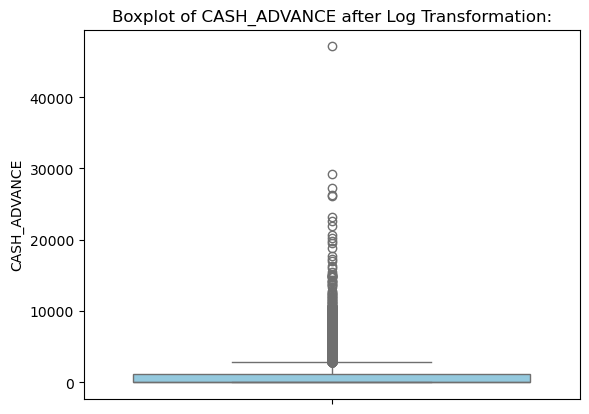

...

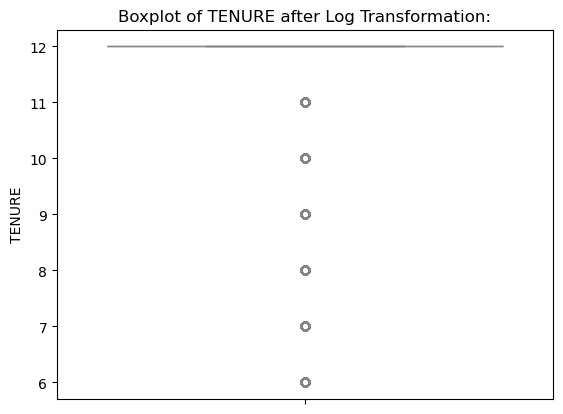

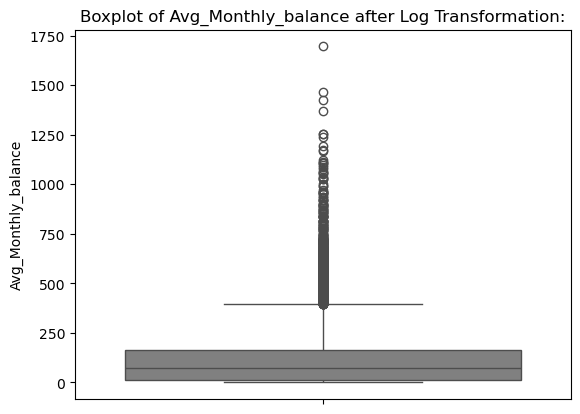

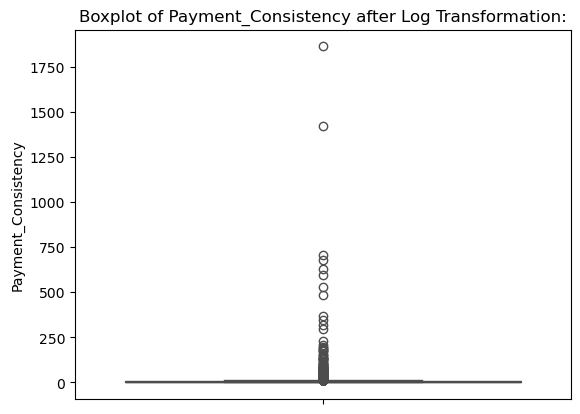

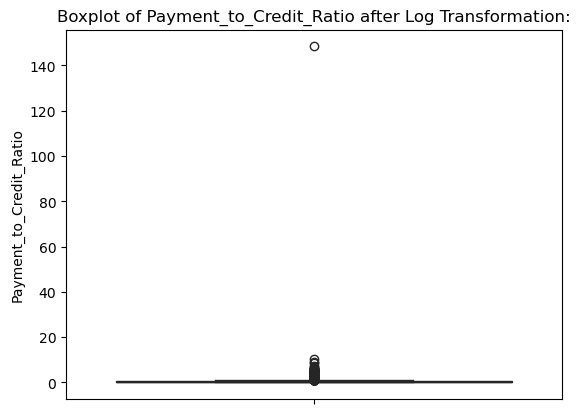

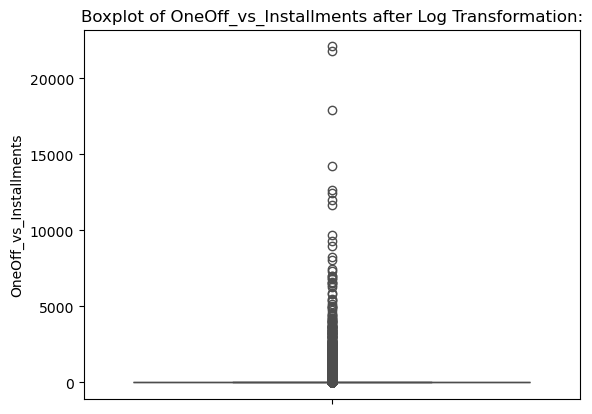

In [263]:
plt.figure(figsize=(300,300))
color=['Yellow','green','blue','red','lavender','skyblue','purple','pink','grey','Yellow','green','blue','red','lavender','skyblue','purple','pink','grey','Yellow','green','blue','red']
for i,col in enumerate(df.columns):
    if df[col].dtype != object:
        if abs(df[col].skew()) > 0.5:
            sns.boxplot(df[col],color=color[i])
            plt.title(f'Boxplot of {col} after Log Transformation:')
            plt.show()


In [109]:
percentile1 = {}
percentile3 = {}
iqr = {}
UL = {}
LL = {}
for i,col in enumerate(df.columns):
    if df[col].dtype != object:
        if abs(df[col].skew()) > 0.5:
            percentile1[col] = df[col].quantile(0.25)
            percentile3[col] = df[col].quantile(0.75)
            iqr[col] = percentile3[col] - percentile1[col]
            UL[col] = percentile3[col] + iqr[col]*1.5
            LL[col] = percentile1[col] - iqr[col]*1.5
            print(f'{col} ULoutlier:',(df[col]>UL[col]).sum())
            print(f'{col} LLoutlier:',(df[col]<LL[col]).sum())
            df[col] = np.where(df[col]>UL[col],UL[col],df[col])
            df[col] = np.where(df[col]<LL[col],LL[col],df[col])
            print(f'{col} after removing  ULoutlier:',(df[col]>UL[col]).sum())
            print(f'{col} after removing LLoutlier:',(df[col]<LL[col]).sum())
            

BALANCE ULoutlier: 0
BALANCE LLoutlier: 0
BALANCE after removing  ULoutlier: 0
BALANCE after removing LLoutlier: 0
PURCHASES ULoutlier: 0
PURCHASES LLoutlier: 0
PURCHASES after removing  ULoutlier: 0
PURCHASES after removing LLoutlier: 0
CASH_ADVANCE_TRX ULoutlier: 267
CASH_ADVANCE_TRX LLoutlier: 0
CASH_ADVANCE_TRX after removing  ULoutlier: 0
CASH_ADVANCE_TRX after removing LLoutlier: 0
PAYMENTS ULoutlier: 0
PAYMENTS LLoutlier: 247
PAYMENTS after removing  ULoutlier: 0
PAYMENTS after removing LLoutlier: 0
TENURE ULoutlier: 0
TENURE LLoutlier: 204
TENURE after removing  ULoutlier: 0
TENURE after removing LLoutlier: 0
Payment_Consistency ULoutlier: 516
Payment_Consistency LLoutlier: 0
Payment_Consistency after removing  ULoutlier: 0
Payment_Consistency after removing LLoutlier: 0
Payment_to_Credit_Ratio ULoutlier: 328
Payment_to_Credit_Ratio LLoutlier: 0
Payment_to_Credit_Ratio after removing  ULoutlier: 0
Payment_to_Credit_Ratio after removing LLoutlier: 0
OneOff_vs_Installments ULoutl

In [111]:
# Label Encoding
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['Risk_Category'] = le.fit_transform(df['Risk_Category'])

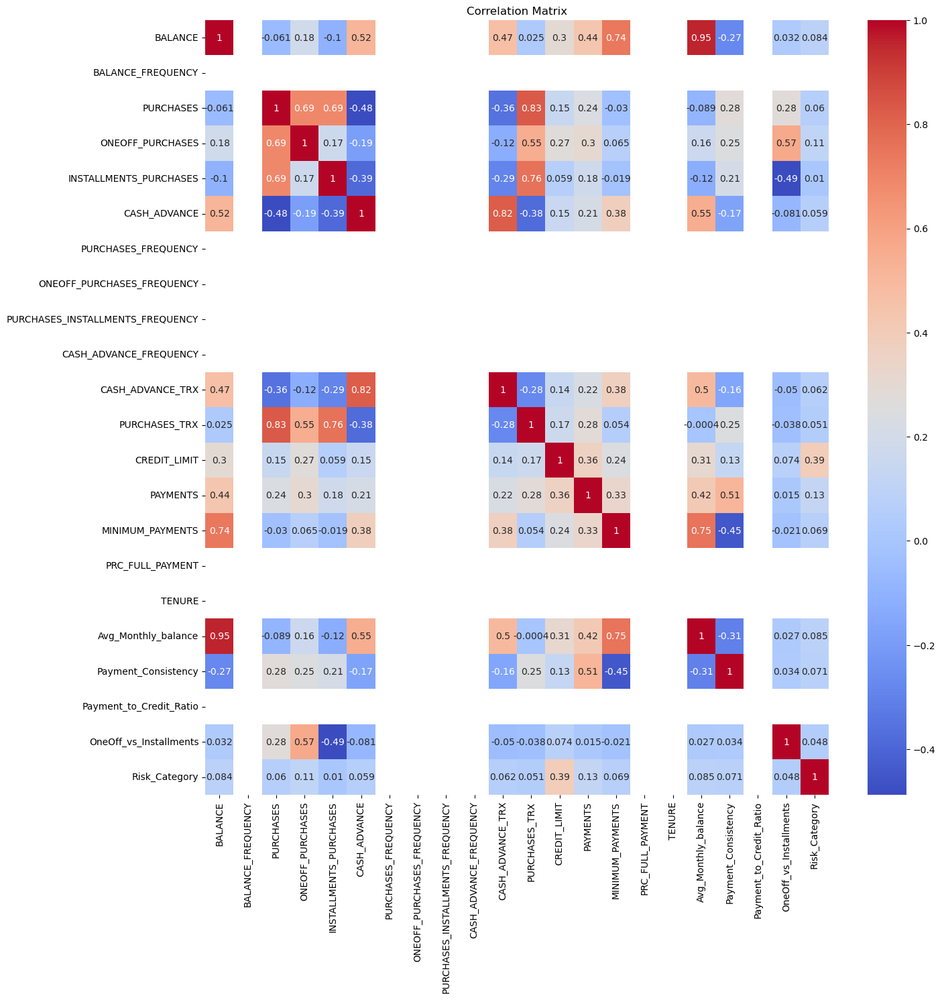

In [113]:
########## Multivariate Analysis
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True,cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [266]:
# Will remove BALANCE , PURCHASES_TRX,MINIMUM_PAYMENTS
df.drop(columns=['BALANCE','PURCHASES_TRX','MINIMUM_PAYMENTS'],axis=1,inplace=True)

In [267]:
df.drop(columns=['PURCHASES_FREQUENCY','ONEOFF_PURCHASES','PURCHASES_INSTALLMENTS_FREQUENCY','ONEOFF_PURCHASES_FREQUENCY','CASH_ADVANCE_FREQUENCY','PRC_FULL_PAYMENT','TENURE','Payment_to_Credit_Ratio'],axis=1,inplace=True)

In [268]:
df['Risk_Category'].value_counts()

Risk_Category
2    4628
0    2280
1    2042
Name: count, dtype: int64

In [269]:
df.columns

Index(['BALANCE_FREQUENCY', 'PURCHASES', 'INSTALLMENTS_PURCHASES',
       'CASH_ADVANCE', 'CASH_ADVANCE_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'Avg_Monthly_balance', 'Payment_Consistency', 'OneOff_vs_Installments',
       'Risk_Category'],
      dtype='object')

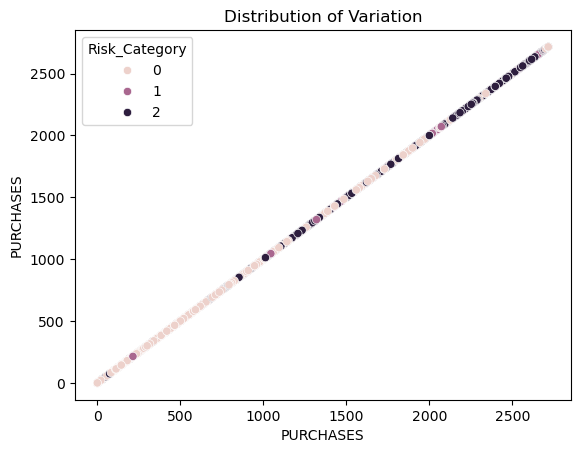

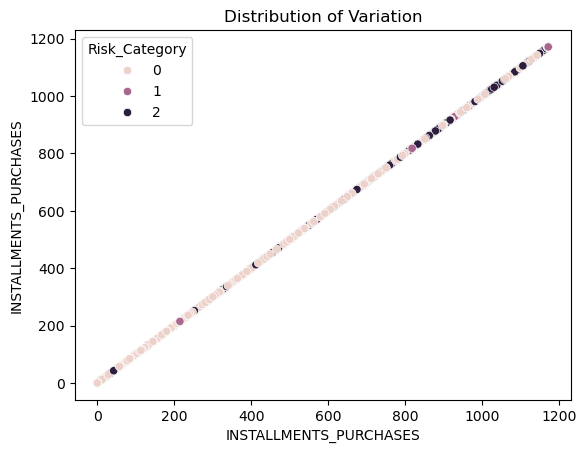

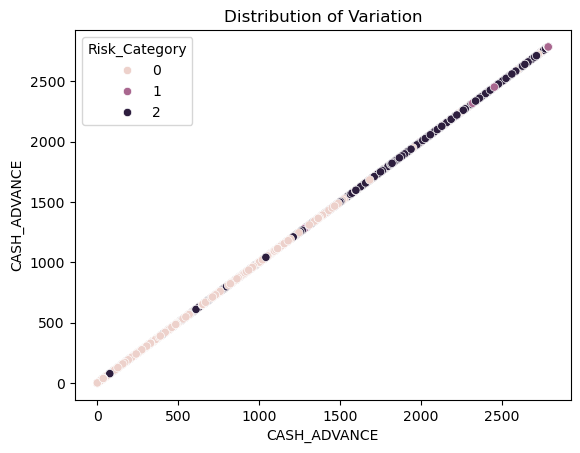

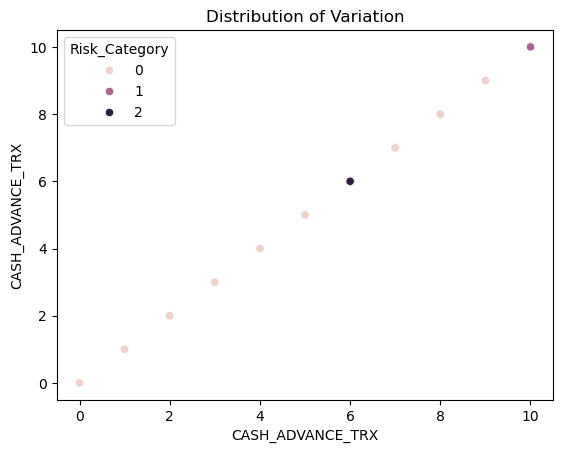

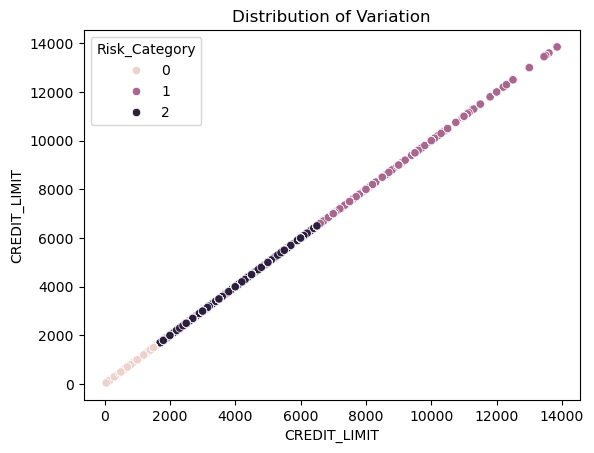

...

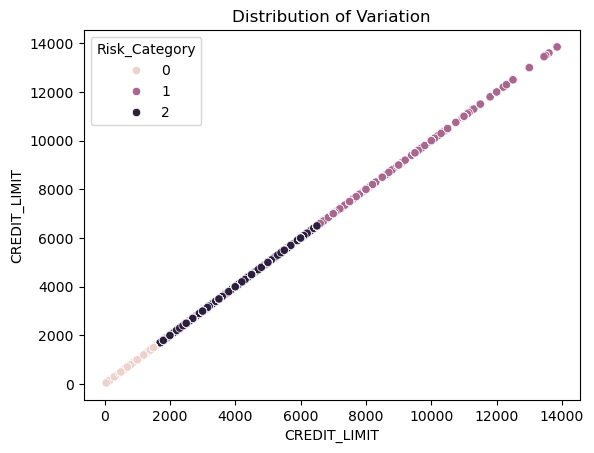

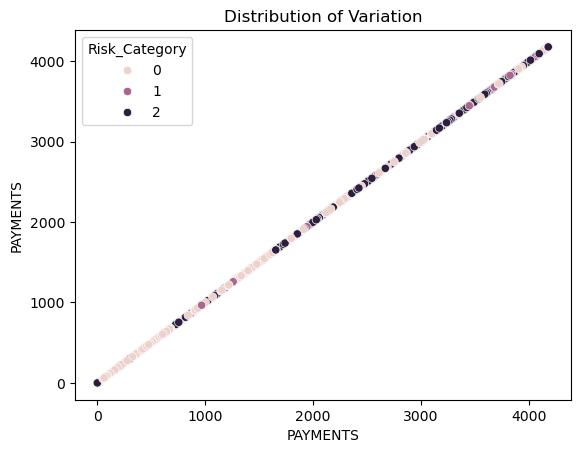

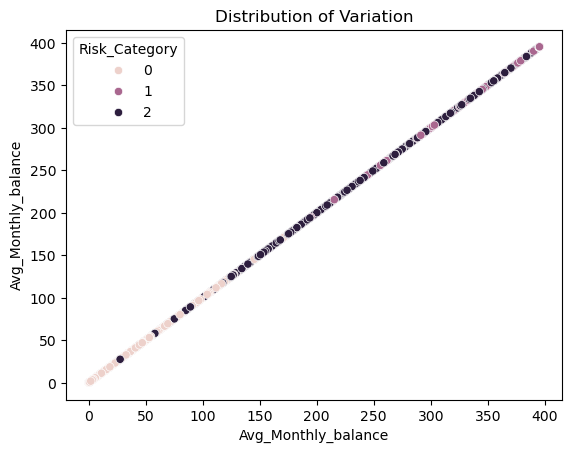

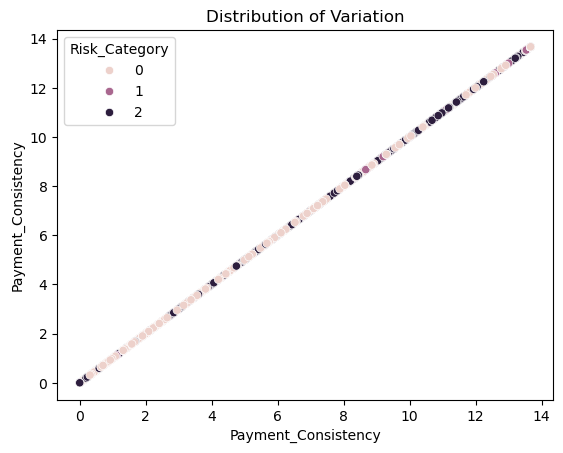

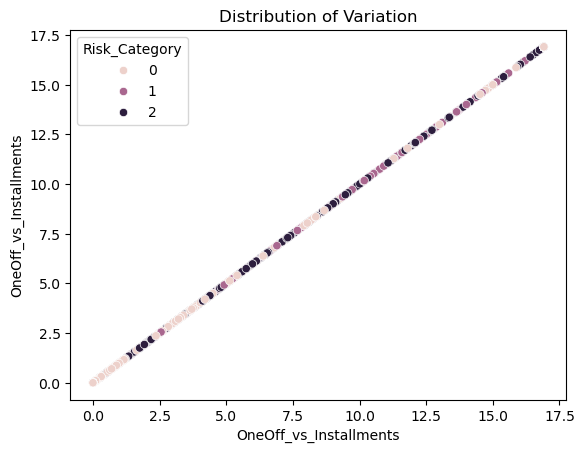

In [270]:
for i, col in enumerate(df.columns):
    for j, col in enumerate(df.columns):
        if i!=j:
            sns.scatterplot(x=col,y=col,data=df,hue='Risk_Category')
            plt.title("Distribution of Variation")
            plt.show()

In [58]:
X = df.drop(['Risk_Category'],axis=1)
y = df['Risk_Category']   # Target

from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [60]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_resampled, y_resampled,test_size=0.2,random_state=42)

## MODELING after Some irrelevant feature drop and handling Imbalanced data using SMOTE

In [314]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
# Train a Random Forest Classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)
# Make predictions
y_pred = clf.predict(X_test)

# Evaluate performance
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nAccuracy Score:\n", accuracy_score(y_test, y_pred))

Confusion Matrix:
 [[986   0   0]
 [  0 887   0]
 [  0   0 904]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       986
           1       1.00      1.00      1.00       887
           2       1.00      1.00      1.00       904

    accuracy                           1.00      2777
   macro avg       1.00      1.00      1.00      2777
weighted avg       1.00      1.00      1.00      2777


Accuracy Score:
 1.0


In [316]:
from xgboost import XGBClassifier

# Train the model
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb_clf.fit(X_train, y_train)

# Predict and evaluate
y_pred = xgb_clf.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print("\nAccuracy Score:\n", accuracy_score(y_test, y_pred))

C:\Users\Aditya Dubey\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:51:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[[986   0   0]
 [  0 886   1]
 [  0   0 904]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       986
           1       1.00      1.00      1.00       887
           2       1.00      1.00      1.00       904

    accuracy                           1.00      2777
   macro avg       1.00      1.00      1.00      2777
weighted avg       1.00      1.00      1.00      2777


Accuracy Score:
 0.9996398991717681


In [318]:
from sklearn.svm import SVC
# Initialize the SVM classifier
svm_clf = SVC(kernel='rbf', C=1.0, gamma='scale', probability=True, random_state=42)

# Train the model
svm_clf.fit(X_train, y_train)
# Predict on test set
y_pred = svm_clf.predict(X_test)
# Confusion Matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nAccuracy Score:\n", accuracy_score(y_test, y_pred))

Confusion Matrix:
[[986   0   0]
 [  0 885   2]
 [ 14   0 890]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       986
           1       1.00      1.00      1.00       887
           2       1.00      0.98      0.99       904

    accuracy                           0.99      2777
   macro avg       0.99      0.99      0.99      2777
weighted avg       0.99      0.99      0.99      2777


Accuracy Score:
 0.9942383867482896


# If feature selction is not done

In [62]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
# Train a Random Forest Classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)
# Make predictions
y_pred = clf.predict(X_test)

# Evaluate performance
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nAccuracy Score:\n", accuracy_score(y_test, y_pred))###### if I dont do feature selection

Confusion Matrix:
 [[895   0  91]
 [  0 774 113]
 [120 101 683]]

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.91      0.89       986
           1       0.88      0.87      0.88       887
           2       0.77      0.76      0.76       904

    accuracy                           0.85      2777
   macro avg       0.85      0.85      0.85      2777
weighted avg       0.85      0.85      0.85      2777


Accuracy Score:
 0.8469571480014404


## Without using SMOTE and Feature Selection

In [115]:
from sklearn.model_selection import train_test_split
X = df.drop(['Risk_Category'],axis=1)
y = df['Risk_Category']   # Target

X_train,X_test,y_train,y_test = train_test_split(X, y,test_size=0.2,random_state=42)
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
# Train a Random Forest Classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)
# Make predictions
y_pred = clf.predict(X_test)

# Evaluate performance
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nAccuracy Score:\n", accuracy_score(y_test, y_pred)) 

Confusion Matrix:
 [[350   0 113]
 [  0 252 131]
 [106  47 791]]

Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.76      0.76       463
           1       0.84      0.66      0.74       383
           2       0.76      0.84      0.80       944

    accuracy                           0.78      1790
   macro avg       0.79      0.75      0.77      1790
weighted avg       0.78      0.78      0.78      1790


Accuracy Score:
 0.7782122905027933


C:\Users\Aditya Dubey\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\Aditya Dubey\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
C:\Users\Aditya Dubey\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:05:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


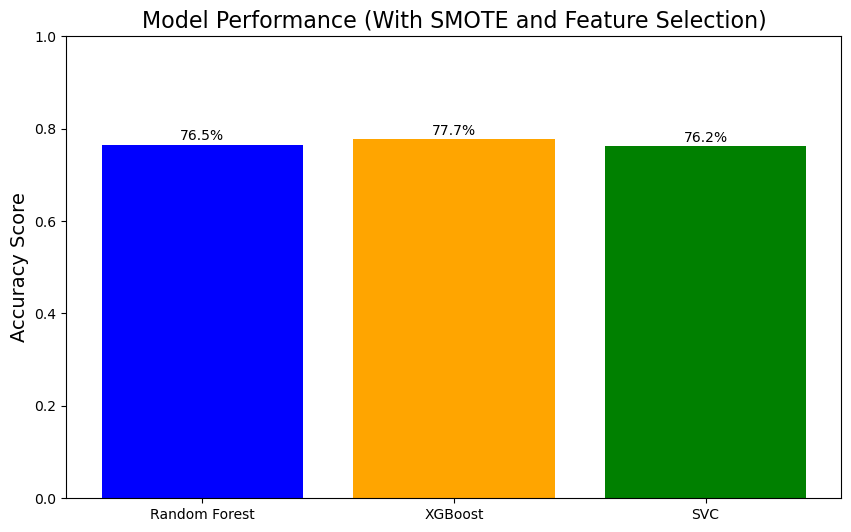

In [133]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Drop specified columns
columns_to_drop = [
    'BALANCE', 'PURCHASES_TRX', 'MINIMUM_PAYMENTS', 'PURCHASES_FREQUENCY',
    'ONEOFF_PURCHASES', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
    'CASH_ADVANCE_FREQUENCY', 'PRC_FULL_PAYMENT', 'TENURE', 'Payment_to_Credit_Ratio'
]
X = df.drop(['Risk_Category'],axis=1)
y = df['Risk_Category']   # Target
X = X.drop(columns=columns_to_drop)

# Splitting data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Perform feature selection (Select top 10 features)
selector = SelectKBest(score_func=f_classif, k=10)
X_train_selected = selector.fit_transform(X_train_smote, y_train_smote)
X_test_selected = selector.transform(X_test)

# Evaluate Models
models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42),
    "SVC": SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)
}

accuracy_results = []

for name, model in models.items():
    model.fit(X_train_selected, y_train_smote)
    y_pred = model.predict(X_test_selected)
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_results.append((name, accuracy))

# Plotting the results
plt.figure(figsize=(10, 6))
bars = plt.bar([result[0] for result in accuracy_results], 
               [result[1] for result in accuracy_results], 
               color=['blue', 'orange', 'green'])

# Adding percentage annotations on top of the bars
for bar, acc in zip(bars, [result[1] for result in accuracy_results]):
    plt.text(bar.get_x() + bar.get_width() / 2, 
             bar.get_height() + 0.01,  # Slightly above the bar
             f'{acc * 100:.1f}%', 
             ha='center', 
             fontsize=10, 
             color='black')

# Chart Configuration
plt.ylabel("Accuracy Score", fontsize=14)
plt.title("Model Performance (With SMOTE and Feature Selection)", fontsize=16)
plt.ylim(0, 1)  # Accuracy is between 0 and 1
plt.show()
